In [2]:
'''
# ДОБАВЬТЕ В НАЧАЛО:
from tensorflow.keras import mixed_precision
policy = mixed_precision.Policy('mixed_float16')
mixed_precision.set_global_policy(policy)
'''

conda activate tensflow && cd projects/ML && optuna-dashboard sqlite:///my_optuna_study_animal10.db

conda activate tensflow && cd projects/ML && tensorboard --logdir=logs/animals10

In [1]:
# Оптимизация TensorFlow
import tensorflow as tf
tf.config.optimizer.set_jit(True)  # Включение XLA-компиляции
tf.config.threading.set_intra_op_parallelism_threads(8)
#tf.config.threading.set_inter_op_parallelism_threads(8)

# Для GPU
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
            #tf.config.experimental.set_memory_limit(gpu, 8192)  # Лимит 8GB
    except RuntimeError as e:
        print(e)

2025-10-26 21:01:34.611711: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-10-26 21:01:34.887026: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1761501694.979795     407 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1761501695.005204     407 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1761501695.218657     407 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [ ]:
#!pip install tensorboard

In [3]:
#!pip install scikit-optimize -q

In [5]:
#!pip install optuna -q

In [6]:
#!pip install optuna-integration[tfkeras] -q

In [7]:
#!pip install optuna-dashboard -q

In [3]:
# переключиться на полуточную арифметику (float16)
import tensorflow as tf
from tensorflow.keras.mixed_precision import Policy
policy = Policy('mixed_float16')
tf.keras.mixed_precision.set_global_policy(policy)

In [5]:
!nvidia-smi

Sun Oct 19 18:48:29 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 575.64.01              Driver Version: 576.80         CUDA Version: 12.9     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 4070        On  |   00000000:01:00.0  On |                  N/A |
|  0%   42C    P8             12W /  200W |     851MiB /  12282MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [17]:
!curl -L -o ~/Downloads/animals10.zip\https://www.kaggle.com/api/v1/datasets/download/alessiocorrado99/animals10

curl: (2) no URL specified
curl: try 'curl --help' or 'curl --manual' for more information


In [2]:
# Текущая директория + путь к датасету

import os
HOME = os.getcwd()
print(HOME)
print('-----------------------')
# Пути
#IMAGE_PATH = "/home/oleg/projects/datasets/construction"
IMAGE_PATH = "/home/oleg/.cache/kagglehub/datasets/alessiocorrado99/animals10/versions/2/raw-img/"
#dataset_path = "./animals"
#dataset_path = "./cars_pretrained"
#dataset_path = "./construction"
#IMAGE_PATH = dataset_path
os.listdir(IMAGE_PATH)

/home/oleg/projects/ML
-----------------------


['gatto',
 'cane',
 'gallina',
 'scoiattolo',
 'elefante',
 'farfalla',
 'ragno',
 'pecora',
 'mucca',
 'cavallo']

In [19]:
!ls /home/oleg/.cache/kagglehub/datasets/alessiocorrado99/animals10/versions/2

home  raw-img  translate.py


In [14]:
import kagglehub
import os

# Установите переменную окружения ПЕРЕД импортом (если нужно перезапустить kernel)
os.environ['KAGGLE_HUB_CACHE'] = "/home/oleg/projects/datasets/kaggle_cache"

# Если уже импортировали kagglehub, перезапустите kernel или используйте:

# Скачиваем
path = kagglehub.dataset_download("alessiocorrado99/animals10")
print("Path to dataset files:", path)

import kagglehub

# Download latest version
path = kagglehub.dataset_download("alessiocorrado99/animals10")

print("Path to dataset files:", path)

Path to dataset files: /home/oleg/.cache/kagglehub/datasets/alessiocorrado99/animals10/versions/2


In [4]:
# как скачать датасет с Kaggle
'''
import os
import kaggle
import zipfile

# Скачаем напрямую через Kaggle API в текущую папку
dataset_name = 'bhavikjikadara/dog-and-cat-classification-dataset'
download_path = './cats_dogs_data'

print("📥 Downloading dataset...")
kaggle.api.dataset_download_files(
    dataset_name, 
    path=download_path, 
    unzip=True  # Важно: распаковываем автоматически!
)
'''

import kagglehub

# Download latest version
path = kagglehub.dataset_download("alessiocorrado99/animals10")

print("Path to dataset files:", path)

/home/oleg/miniconda3/envs/tensflow/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


100%|████████████████████████████████████████████████████████████████████████████████| 586M/586M [00:21<00:00, 29.0MB/s]

Extracting files...


Path to dataset files: /home/oleg/.cache/kagglehub/datasets/alessiocorrado99/animals10/versions/2


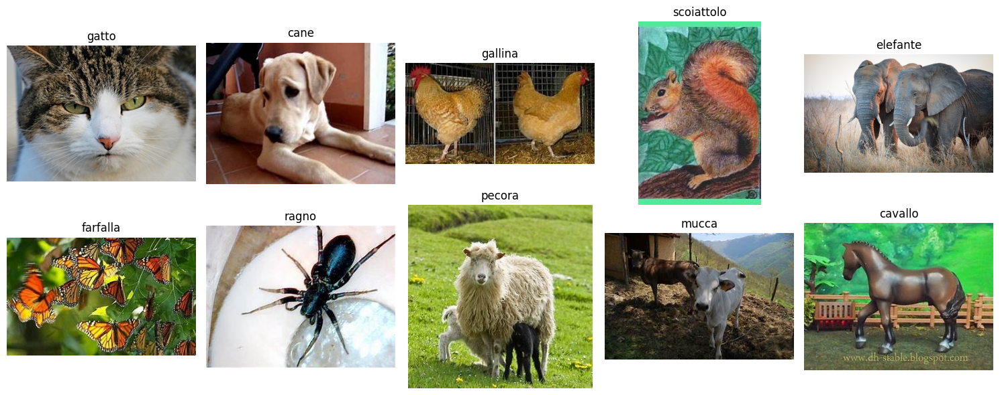

🎲 Показано по 1 случайному изображению из 10 категорий


In [4]:
# Показано по 1 случайному изображению из каждой категорий
from PIL import Image
import os
import matplotlib.pyplot as plt
import random

# Создаем график 2x5
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
axes = axes.ravel()

categories = os.listdir(IMAGE_PATH)
plot_index = 0

for category in categories:
    category_path = os.path.join(IMAGE_PATH, category)
    file_names = os.listdir(category_path)
    
    # Берем 1 случайное изображение из каждой категории
    if file_names:
        random_file = random.choice(file_names)
        img_path = os.path.join(category_path, random_file)
        img = Image.open(img_path)
        
        axes[plot_index].imshow(img)
        axes[plot_index].set_title(f"{category}", fontsize=12)
        axes[plot_index].axis('off')
        plot_index += 1

# Скрываем лишние subplot'ы
for i in range(plot_index, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

print(f"🎲 Показано по 1 случайному изображению из {plot_index} категорий")

📊 АНАЛИЗ ДАТАСЕТА:
  cane: 4863 файлов
  cavallo: 2623 файлов
  elefante: 1446 файлов
  farfalla: 2112 файлов
  gallina: 3098 файлов
  gatto: 1668 файлов
  mucca: 1866 файлов
  pecora: 1820 файлов
  ragno: 4821 файлов
  scoiattolo: 1862 файлов
📈 ИТОГО: 26179 изображений, 10 классов


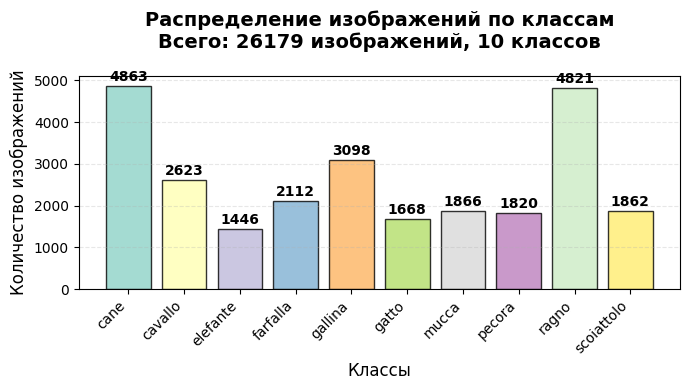

In [5]:
# Простой анализ датасета с визуализацией

import os
import matplotlib.pyplot as plt
import numpy as np

def analyze_dataset_simple(dataset_path):
    """
    Простой анализ датасета с визуализацией
    """
    # Проверяем существование пути
    if not os.path.exists(dataset_path):
        print(f"❌ Ошибка: путь '{dataset_path}' не существует")
        return None
    
    # Получаем список классов
    class_names = [d for d in os.listdir(dataset_path) 
                  if os.path.isdir(os.path.join(dataset_path, d))]
    class_names.sort()
    
    if not class_names:
        print("❌ В датасете не найдено папок с классами")
        return None
    
    # Подсчет файлов
    class_counts = {}
    total_files = 0
    
    print("📊 АНАЛИЗ ДАТАСЕТА:")
    for class_name in class_names:
        class_path = os.path.join(dataset_path, class_name)
        image_files = [f for f in os.listdir(class_path) 
                      if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
        count = len(image_files)
        class_counts[class_name] = count
        total_files += count
        print(f"  {class_name}: {count} файлов")
    
    print(f"📈 ИТОГО: {total_files} изображений, {len(class_names)} классов")
    
    # Визуализация
    plt.figure(figsize=(7, 4))
    
    classes = list(class_counts.keys())
    counts = list(class_counts.values())
    
    # Создаем диаграмму
    bars = plt.bar(classes, counts, color=plt.cm.Set3(np.linspace(0, 1, len(classes))), 
                   edgecolor='black', alpha=0.8)
    
    # Настройки графика
    plt.title(f'Распределение изображений по классам\nВсего: {total_files} изображений, {len(class_names)} классов', 
              fontsize=14, fontweight='bold', pad=20)
    plt.xlabel('Классы', fontsize=12)
    plt.ylabel('Количество изображений', fontsize=12)
    
    # Поворачиваем подписи и выравниваем
    plt.xticks(rotation=45, ha='right')
    
    # Добавляем значения на столбцы
    for bar, count in zip(bars, counts):
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + max(counts)*0.01,
                f'{count}', ha='center', va='bottom', fontweight='bold', fontsize=10)
    
    # Добавляем сетку для удобства чтения
    plt.grid(True, axis='y', alpha=0.3, linestyle='--')
    
    # Настраиваем отступы
    plt.tight_layout()
    
    plt.show()
    
    return {'class_names': class_names, 'class_counts': class_counts, 'total_files': total_files}

# ИСПОЛЬЗОВАНИЕ:
# Просто вызовите функцию с путем к вашему датасету
result = analyze_dataset_simple(IMAGE_PATH)

In [ ]:
!pip install optuna

In [3]:
# МЕТКИ INTEGER

# САМЫЙ ПРОСТОЙ ВАРИАНТ - integer labels

import tensorflow as tf

#from tensorflow.keras.applications.resnet50 import preprocess_input        # импорт для resnet50
from tensorflow.keras.applications.efficientnet import preprocess_input     # импорт для efficientnet
#from tensorflow.keras.applications.efficientnet_v2 import preprocess_input

import numpy as np
import matplotlib.pyplot as plt

height, width = 224, 224
batch_size=32

print("🔄 СОЗДАЕМ ПАЙПЛАЙН...")

# Загрузка данных (хорошо!)
train_data_raw = tf.keras.preprocessing.image_dataset_from_directory(
    IMAGE_PATH,
    validation_split=0.2,
    subset='training',
    seed=42,
    image_size=(height, width),
    batch_size=batch_size,
    shuffle=True
)

validation_data_raw = tf.keras.preprocessing.image_dataset_from_directory(
    IMAGE_PATH,
    validation_split=0.2,
    subset='validation', 
    seed=42,
    image_size=(height, width),
    batch_size=batch_size,
    shuffle=True
)

# Проверка формата (хорошо!)
images, labels = next(iter(train_data_raw))
print(f"Labels shape: {labels.shape}")  # (32,) - integer
print(f"Labels: {labels.numpy()[:15]}")  # [0, 1, 0, 2, 1]

class_names = train_data_raw.class_names
num_classes = len(class_names)
print(f"🏷️ Классы: {class_names}")

# Аугментация (хорошо!)
data_augmentation = tf.keras.Sequential([
    # ГЕОМЕТРИЧЕСКИЕ ТРАНСФОРМАЦИИ
    #layers.experimental.preprocessing.Resizing(224,224),
    tf.keras.layers.RandomFlip("horizontal"),
    #f.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.2), # увеличить угол
    tf.keras.layers.RandomZoom(0.2), # увеличить зум
    #tf.keras.layers.RandomTranslation(0.2, 0.2),  # сдвиг по X и Y
    # ЦВЕТОВЫЕ ТРАНСФОРМАЦИИ  
    #tf.keras.layers.RandomContrast(0.2),
    #tf.keras.layers.RandomBrightness(0.2),
    
    # ШУМЫ И ИСКАЖЕНИЯ
    #tf.keras.layers.GaussianNoise(0.1),
    
    
    ])

#print("🔧 СОЗДАЕМ ПРОСТОЙ ПАЙПЛАЙН...")

'''
# Проепроцессин для RESNET
def preprocess_and_augment(image, label, training=False):
    """Preprocess + аугментация если training=True"""
    image = preprocess_input(tf.cast(image, tf.float32))
    if training:
        image = data_augmentation(image, training=True)
    return image, label
'''


# Проепроцессин для EfficientNet
def preprocess_and_augment(image, label, training=False):
    """Правильный препроцессинг для EfficientNet"""
    image = tf.cast(image, tf.float32)
    #image = preprocess_input(image)  # ✅ Должен нормализовать в [0, 1] или [-1, 1]
    if training:
        image = data_augmentation(image, training=True)
    return image, label

# Финальные datasets
train_data = (
    train_data_raw
    .map(lambda x, y: preprocess_and_augment(x, y, training=True),
         num_parallel_calls=tf.data.AUTOTUNE)
    .cache()  # ✅ ДОБАВИТЬ: кэширование ускорит обучение    
    .prefetch(tf.data.AUTOTUNE)
)

validation_data = (
    validation_data_raw
    .map(lambda x, y: preprocess_and_augment(x, y, training=False), 
         num_parallel_calls=tf.data.AUTOTUNE)
    .cache()  # ✅ ДОБАВИТЬ: кэширование ускорит обучение    
    .prefetch(tf.data.AUTOTUNE)
)

# Убедимся что препроцессинг работает правильно
print("🔍 Проверка препроцессинга:")
for images, labels in train_data.take(1):
    print(f"Shape: {images.shape}")
    print(f"Data range: {tf.reduce_min(images):.3f} to {tf.reduce_max(images):.3f}")
    print(f"Mean: {tf.reduce_mean(images):.3f}")
    break

print("✅ Пайплайн создан!")

🔄 СОЗДАЕМ ПАЙПЛАЙН...
Found 26179 files belonging to 10 classes.
Using 20944 files for training.


I0000 00:00:1761501708.644591     407 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9558 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4070, pci bus id: 0000:01:00.0, compute capability: 8.9


Found 26179 files belonging to 10 classes.
Using 5235 files for validation.
Labels shape: (32,)
Labels: [8 7 8 7 3 4 9 2 9 8 4 4 4 6 2]
🏷️ Классы: ['cane', 'cavallo', 'elefante', 'farfalla', 'gallina', 'gatto', 'mucca', 'pecora', 'ragno', 'scoiattolo']
🔍 Проверка препроцессинга:


I0000 00:00:1761501710.636771     699 service.cc:152] XLA service 0x7bc8340026f0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1761501710.636821     699 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 4070, Compute Capability 8.9
I0000 00:00:1761501710.729875     699 cuda_dnn.cc:529] Loaded cuDNN version 91400
2025-10-26 21:01:50.749249: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile
I0000 00:00:1761501710.811783     699 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


Shape: (32, 224, 224, 3)
Data range: 0.000 to 255.000
Mean: 130.804
✅ Пайплайн создан!


2025-10-26 21:01:51.339724: W tensorflow/core/kernels/data/cache_dataset_ops.cc:916] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


🎯 Расчет весов классов из тренировочных данных...


2025-10-26 21:01:55.403274: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile
2025-10-26 21:01:55.474791: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile
2025-10-26 21:01:55.577951: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile
2025-10-26 21:01:55.788478: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile
2025-10-26 21:01:55.832525: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile
2025-10-26 21:01:55.841676: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile
2025-10-26 21:01:55.970822: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile
2025-10-26 21:01:56.028337: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile
2025-10-26 21:01:56.067471: W tensorflow/core/lib/png/png_io.cc:92] PNG 

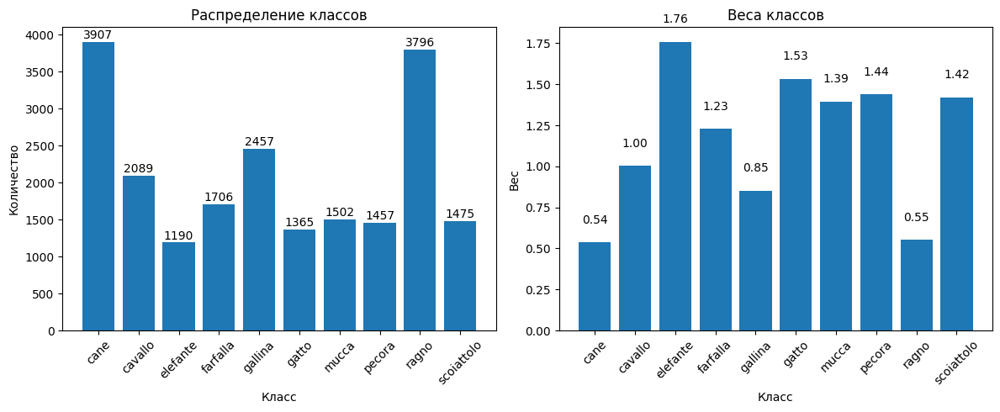

📊 РАСПРЕДЕЛЕНИЕ КЛАССОВ:
--------------------------------------------------
cane            | 3907 | вес: 0.54
cavallo         | 2089 | вес: 1.00
elefante        | 1190 | вес: 1.76
farfalla        | 1706 | вес: 1.23
gallina         | 2457 | вес: 0.85
gatto           | 1365 | вес: 1.53
mucca           | 1502 | вес: 1.39
pecora          | 1457 | вес: 1.44
ragno           | 3796 | вес: 0.55
scoiattolo      | 1475 | вес: 1.42


In [4]:
# Рассчитывает веса классов из tf.data.Dataset

def get_class_weights_from_dataset(dataset, class_names):
    """
    Рассчитывает веса классов из tf.data.Dataset
    """
    # Собираем все метки
    all_labels = []
    for images, labels in dataset:
        all_labels.extend(labels.numpy())
    
    y_train = np.array(all_labels)
    
    # Расчет весов
    from sklearn.utils.class_weight import compute_class_weight
    class_weights = compute_class_weight(
        'balanced',
        classes=np.unique(y_train),
        y=y_train
    )
    
    weights_dict = dict(enumerate(class_weights))
    
    # Визуализация
    plt.figure(figsize=(12, 5))
    
    # График 1: Распределение классов
    plt.subplot(1, 2, 1)
    unique, counts = np.unique(y_train, return_counts=True)
    bars = plt.bar(range(len(unique)), counts)
    plt.title('Распределение классов')
    plt.xlabel('Класс')
    plt.ylabel('Количество')
    plt.xticks(range(len(unique)), [class_names[i] for i in unique], rotation=45)
    
    for bar, count in zip(bars, counts):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 10, 
                str(count), ha='center', va='bottom')
    
    # График 2: Веса классов
    plt.subplot(1, 2, 2)
    bars = plt.bar(weights_dict.keys(), weights_dict.values())
    plt.title('Веса классов')
    plt.xlabel('Класс')
    plt.ylabel('Вес')
    plt.xticks(range(len(unique)), [class_names[i] for i in unique], rotation=45)
    
    for bar, weight in zip(bars, weights_dict.values()):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1, 
                f'{weight:.2f}', ha='center', va='bottom')
    
    plt.tight_layout()
    plt.show()
    
    # Вывод информации
    print("📊 РАСПРЕДЕЛЕНИЕ КЛАССОВ:")
    print("-" * 50)
    for i, class_name in enumerate(class_names):
        count = counts[i] if i < len(counts) else 0
        weight = weights_dict.get(i, 0)
        print(f"{class_name:15} | {count:4} | вес: {weight:.2f}")
    
    return weights_dict

# ИСПОЛЬЗОВАНИЕ:
print("🎯 Расчет весов классов из тренировочных данных...")
class_weights = get_class_weights_from_dataset(train_data_raw, class_names)

🎲 АУГМЕНТИРОВАННЫЕ ИЗОБРАЖЕНИЯ ИЗ TRAIN_DATA:


2025-10-26 15:25:53.436527: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile
2025-10-26 15:25:53.503693: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile
2025-10-26 15:25:53.626990: W tensorflow/core/kernels/data/cache_dataset_ops.cc:916] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


Размер батча: (32, 224, 224, 3)
Количество изображений: 32


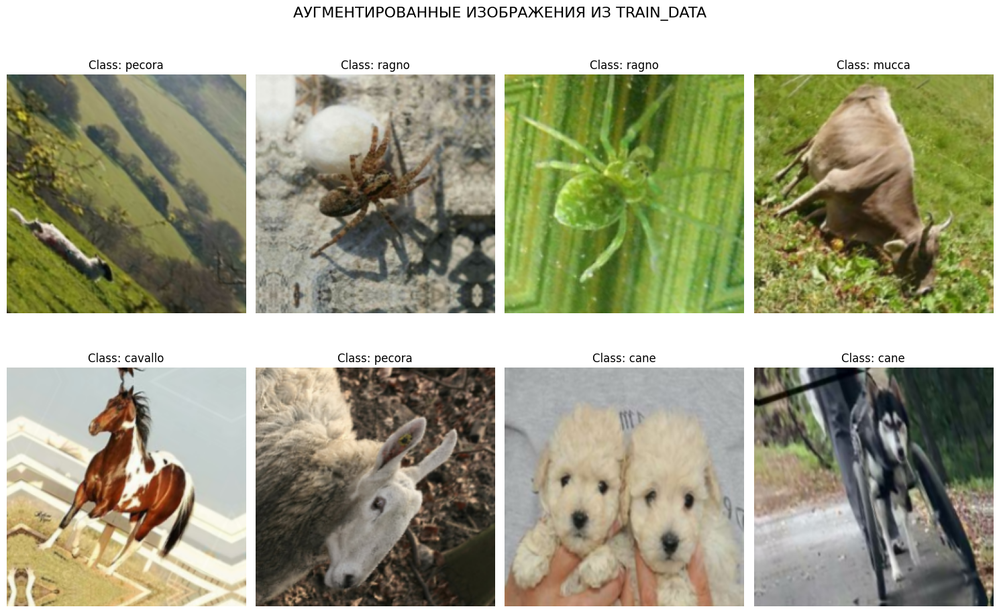

Диапазон данных в батче: 0.000 до 255.000


In [11]:
def show_augmented_batch():
    """Показывает аугментированные изображения из train_data"""
    # Берем один батч из train_data
    for images, labels in train_data.take(1):
        print(f"Размер батча: {images.shape}")  # (batch_size, height, width, channels)
        print(f"Количество изображений: {len(images)}")
        
        plt.figure(figsize=(15, 10))
        
        # Показываем первые 8 изображений из батча
        for i in range(min(8, len(images))):
            plt.subplot(2, 4, i+1)
            
            # Берем изображение из батча
            image = images[i]
            label = labels[i]
            
            # Денормализуем если нужно (из [0,1] в [0,255])
            if tf.reduce_max(image) <= 1.0:
                image = image * 255
            image = tf.cast(image, tf.uint8)
            
            plt.imshow(image)
            plt.title(f'Class: {class_names[label.numpy()]}')
            plt.axis('off')
        
        plt.suptitle('АУГМЕНТИРОВАННЫЕ ИЗОБРАЖЕНИЯ ИЗ TRAIN_DATA', fontsize=16)
        plt.tight_layout()
        plt.show()
        
        # Проверяем диапазон данных
        print(f"Диапазон данных в батче: {tf.reduce_min(images):.3f} до {tf.reduce_max(images):.3f}")
        break

# Запускаем
print("🎲 АУГМЕНТИРОВАННЫЕ ИЗОБРАЖЕНИЯ ИЗ TRAIN_DATA:")
show_augmented_batch()

🎨 ВИЗУАЛИЗАЦИЯ (1 пример на класс):
📊 Распределение в тренировочных данных:


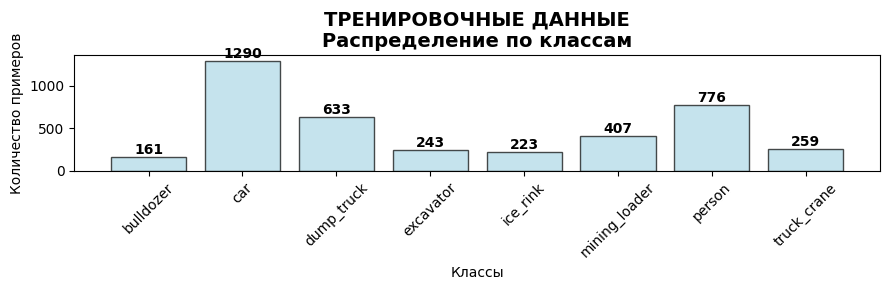

📊 Распределение в валидационных данных:


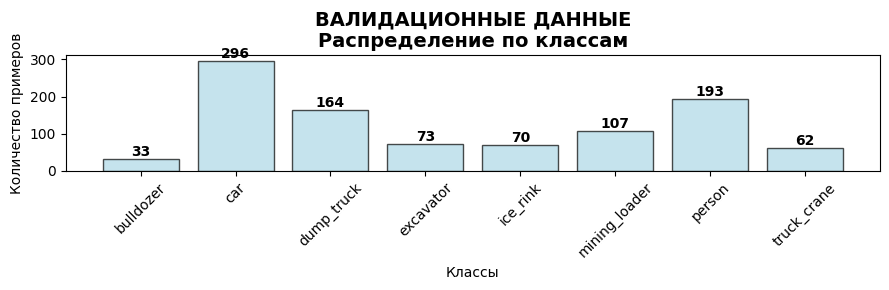


🖼️ По одному примеру на класс (тренировка):


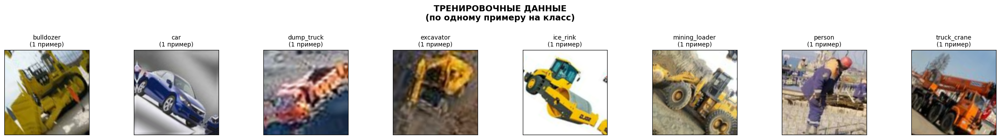


🖼️ По одному примеру на класс (валидация):


2025-10-19 18:49:32.898035: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


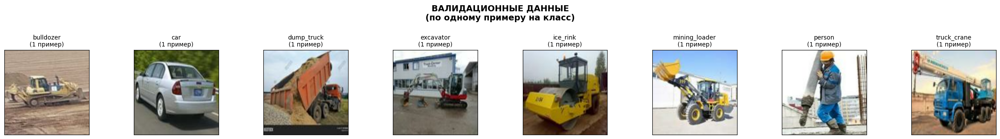

In [15]:
def visualize_single_example_per_class(dataset, class_names, title=""):
    """
    Визуализация по одному примеру для каждого класса
    """
    # Собираем все изображения и метки
    all_images = []
    all_labels = []
    
    for images, labels in dataset.take(10):  # Берем несколько батчей
        all_images.append(images.numpy())
        all_labels.append(labels.numpy())
    
    all_images = np.concatenate(all_images, axis=0)
    all_labels = np.concatenate(all_labels, axis=0)
    
    # Создаем сетку для визуализации
    cols = len(class_names)
    fig, axes = plt.subplots(1, cols, figsize=(3*cols, 3))
    
    if cols == 1:
        axes = [axes]
    
    fig.suptitle(f'{title}\n(по одному примеру на класс)', fontsize=14, fontweight='bold', y=1.05)
    
    for class_idx, class_name in enumerate(class_names):
        ax = axes[class_idx]
        
        # Находим первый пример этого класса
        class_mask = all_labels == class_idx
        class_examples = all_images[class_mask]
        
        if len(class_examples) > 0:
            # Берем первый пример класса
            image = class_examples[0].copy()
            
            # Восстанавливаем оригинальные цвета
            image[..., 0] += 103.939  # B
            image[..., 1] += 116.779  # G
            image[..., 2] += 123.68   # R
            image = np.clip(image, 0, 255).astype('uint8')
            image = image[..., ::-1]  # BGR → RGB
            
            ax.imshow(image)
            ax.set_title(f'{class_name}\n(1 пример)', fontsize=10)
        else:
            ax.imshow(np.zeros((224, 224, 3)))
            ax.set_title(f'{class_name}\n(нет примеров)', fontsize=10)
            ax.text(0.5, 0.5, 'Нет примеров', 
                   ha='center', va='center', 
                   transform=ax.transAxes, fontsize=8)
        
        ax.set_xticks([])
        ax.set_yticks([])
        ax.grid(False)
    
    plt.tight_layout()
    plt.show()

# БЫСТРАЯ версия распределения
def visualize_class_distribution_simple(dataset, class_names, title=""):
    """
    Упрощенная визуализация распределения классов
    """
    # Считаем количество примеров по классам
    class_counts = {name: 0 for name in class_names}
    
    for images, labels in dataset:
        for label in labels.numpy():
            class_counts[class_names[label]] += 1
    
    # Визуализация
    plt.figure(figsize=(9, 3))
    
    classes = list(class_counts.keys())
    counts = list(class_counts.values())
    
    bars = plt.bar(classes, counts, color='lightblue', edgecolor='black', alpha=0.7)
    plt.title(f'{title}\nРаспределение по классам', fontsize=14, fontweight='bold')
    plt.xlabel('Классы')
    plt.ylabel('Количество примеров')
    plt.xticks(rotation=45)
    
    # Добавляем значения на столбцы
    for bar, count in zip(bars, counts):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1,
                f'{count}', ha='center', va='bottom', fontweight='bold')
    
    plt.tight_layout()
    plt.show()
    
    return class_counts

# Тестируем упрощенную версию
print("🎨 ВИЗУАЛИЗАЦИЯ (1 пример на класс):")
print("📊 Распределение в тренировочных данных:")
train_counts = visualize_class_distribution_simple(train_data, class_names, "ТРЕНИРОВОЧНЫЕ ДАННЫЕ")

print("📊 Распределение в валидационных данных:")
val_counts = visualize_class_distribution_simple(validation_data, class_names, "ВАЛИДАЦИОННЫЕ ДАННЫЕ")

print("\n🖼️ По одному примеру на класс (тренировка):")
visualize_single_example_per_class(train_data, class_names, "ТРЕНИРОВОЧНЫЕ ДАННЫЕ")

print("\n🖼️ По одному примеру на класс (валидация):")
visualize_single_example_per_class(validation_data, class_names, "ВАЛИДАЦИОННЫЕ ДАННЫЕ")

In [8]:
# 2. Optuna (Bayesian Optimization)

import optuna
from optuna.integration import TFKerasPruningCallback
import tensorflow as tf
#--------------------------------------------------------------------------------------------------------------------
from tensorflow.keras.applications import ResNet50, EfficientNetV2S, EfficientNetV2B0, EfficientNetB0, EfficientNetV2M, EfficientNetV2L
# from tensorflow.keras.applications import (
#     ResNet50,
#     EfficientNetV2S, EfficientNetV2B0, EfficientNetV2B1, EfficientNetV2B2, 
#     EfficientNetV2B3, EfficientNetV2L, EfficientNetV2M, EfficientNetV2XL
# )
#from convnext import ConvNeXtTiny, ConvNeXtSmall, ConvNeXtBase, ConvNeXtLarge, ConvNeXtXLarge

#-----------------------------------------------------------------------------------------------------------------------
from tensorflow.keras import layers, Model
from tensorflow.keras.layers import (GlobalAveragePooling2D, GlobalMaxPooling2D, Dense, Dropout, BatchNormalization, Activation, Concatenate, Add)
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt

import gc
gc.collect()     # принудительно очищаем

import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['TF_XLA_FLAGS'] = '--tf_xla_auto_jit=0'
tf.get_logger().setLevel('ERROR')

# 🔧 СЛОВАРЬ MODELS:
MODELS = {
    # EfficientNetV2 Family (рекомендуется)
    # 'EfficientNetV2B0': EfficientNetV2B0,
    # 'EfficientNetV2B1': EfficientNetV2B1, 
    # 'EfficientNetV2B2': EfficientNetV2B2,
    # 'EfficientNetV2B3': EfficientNetV2B3,
    'EfficientNetV2S': EfficientNetV2S,
    'EfficientNetV2M': EfficientNetV2M, 
    'EfficientNetV2L': EfficientNetV2L,
    # 'EfficientNetV2XL': EfficientNetV2XL,
   
    # ResNet Family  
    'ResNet50': ResNet50,
    # 'ResNeXt50': ResNeXt50,

    #   print("⚠️ ConvNeXt не установлен. Для установки: pip install convnext-tensorflow")
    # ConvNeXt Family
    # 'ConvNeXtTiny': ConvNeXtTiny,
    # 'ConvNeXtSmall': ConvNeXtSmall,
    # 'ConvNeXtBase': ConvNeXtBase, 
    # 'ConvNeXtLarge': ConvNeXtLarge,
    # 'ConvNeXtXLarge': ConvNeXtXLarge,
}


# =============================================================================
# 🔧 ПРЕДВАРИТЕЛЬНЫЕ НАСТРОЙКИ (ДОЛЖНЫ БЫТЬ ОПРЕДЕЛЕНЫ!)
# =============================================================================

# 🎯 ЗАДАЙТЕ ЭТИ ПЕРЕМЕННЫЕ ПЕРЕД ЗАПУСКОМ:

model_name = 'EfficientNetV2S'  # Или 'EfficientNetV2S' и т.д.
n_trials = 10

height, width = 224, 224

def residual_block(x, units, dropout_rate=0.5, l2_reg=1e-5, activation='relu'):
    """Оптимизированный residual block для небольших датасетов"""
    
    # Основной путь
    # x = Dense(units, kernel_regularizer=l2(l2_reg))(x)
    # x = BatchNormalization()(x)
    # x = Activation(activation)(x)
    # x = Dropout(dropout_rate)(x)

    x = Dense(units, activation=activation, kernel_regularizer=l2(l2_reg))(x)
    x = BatchNormalization()(x)
    x = Dropout(dropout_rate)(x)
    
    return x

def create_optuna_model(trial):
    """Создает модель с параметрами которые предлагает Optuna"""
    
    # 1. Optuna предлагает параметры для тестирования
    #units_1 = trial.suggest_categorical('units_1', [256, 512])
    units_2 = trial.suggest_categorical('units_2', [128, 256]) 
    units_3 = trial.suggest_categorical('units_3', [64, 128])
    #dropout_1 = trial.suggest_categorical('dropout_1', [0.6, 0.7, 0.8])
    dropout_2 = trial.suggest_categorical('dropout_2', [0.5, 0.6, 0.7])
    dropout_3 = trial.suggest_categorical('dropout_3', [0.2, 0.3, 0.4])
    l2_reg = trial.suggest_categorical('l2_reg', [1e-6, 1e-5, 1e-4, 1e-3])
    learning_rate = trial.suggest_categorical('learning_rate', [1e-6, 1e-5, 1e-4, 1e-3])
    activation = trial.suggest_categorical('activation', ['relu', 'elu']) #, 'selu'])

    # 2. ВХОД И БАЗОВАЯ МОДЕЛЬ
    inputs = tf.keras.Input(shape=(height, width, 3))
    
    base_model = MODELS[model_name](
        weights='imagenet',
        include_top=False,
        input_shape=(height, width, 3)
    )
    base_model.trainable = False
    x = base_model(inputs, training=False)
    '''
    # 98-40
    # 3. КЛАССИФИКАТОР С ДВОЙНЫМ POOLING
    gap = GlobalAveragePooling2D()(x)
    gmp = GlobalMaxPooling2D()(x)
    x = Concatenate()([gap, gmp])
    x = BatchNormalization()(x)
    # 4. РЕЗИДУАЛЬНЫЕ БЛОКИ (ПЕРЕДАЕМ ВСЕ ПАРАМЕТРЫ)
    #x = residual_block(x, units_1, dropout_1, l2_reg, activation)
    x = residual_block(x, units_2, dropout_2, l2_reg, activation) 
    x = residual_block(x, units_3, dropout_3, l2_reg, activation)
    '''
    # 3. КЛАССИФИКАТОР С ДВОЙНЫМ POOLING
    #gap = GlobalAveragePooling2D()(x)
    #x = GlobalMaxPooling2D()(x)
    x = GlobalAveragePooling2D()(x)
    
    #x = BatchNormalization()(x)
    # 4. РЕЗИДУАЛЬНЫЕ БЛОКИ (ПЕРЕДАЕМ ВСЕ ПАРАМЕТРЫ)
    #x = residual_block(x, units_1, dropout_1, l2_reg, activation)
    x = residual_block(x, units_2, dropout_2, l2_reg, activation) 
    x = residual_block(x, units_3, dropout_3, l2_reg, activation)
#==================================================================================================
    # x = layers.GlobalAveragePooling2D()(x)
    # x = layers.BatchNormalization()(x)  # ⬅️ Добавляем BatchNorm
    # x = layers.Dense(units_1, activation)(x)
    # x = layers.BatchNormalization()(x)
    # x = layers.Dropout(dropout_2)(x)
    # x = layers.Dense(units_1, activation)(x) 
    # x = layers.BatchNormalization()(x)
    # x = layers.Dropout(dropout_3)(x)
#==================================================================================================
    
    # 5. ВЫХОДНОЙ СЛОЙ
    outputs = Dense(num_classes, activation='softmax')(x)

    
    # 6. СОБИРАЕМ И КОМПИЛИРУЕМ МОДЕЛЬ
    model = Model(inputs, outputs)
    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    
    return model

# =============================================================================
# 🎯 ФУНКЦИЯ OPTIMIZATION
# =============================================================================

def objective(trial):
    """Целевая функция для Optuna"""
    
    model = create_optuna_model(trial)
    
    history = model.fit(
        train_data,
        epochs=10,
        validation_data=validation_data,
        verbose=1,
        callbacks=[
            EarlyStopping(
                monitor='val_accuracy',
                patience=15,
                restore_best_weights=True,
                verbose=1
            ),
            TFKerasPruningCallback(trial, 'val_accuracy')
        ]
    )
    
    best_val_accuracy = max(history.history['val_accuracy'])
    return best_val_accuracy

# =============================================================================
# 🚀 ЗАПУСК ОПТИМИЗАЦИИ
# =============================================================================

print("🚀 ЗАПУСК OPTUNA OPTIMIZATION...")

study = optuna.create_study(
    direction='maximize',
    study_name='EfficientNetV2S_MINI_animals10_test_7',
    #storage='sqlite:///my_optuna_study.db',
    storage='sqlite:///my_optuna_study_animal10.db',
    load_if_exists=False
)

study.optimize(objective, n_trials=n_trials)

print("\n🎯 OPTUNA ОПТИМИЗАЦИЯ ЗАВЕРШЕНА!")

import gc
gc.collect()     # принудительно очищаем

# РЕЗУЛЬТАТЫ
print(f"\n🏆 ЛУЧШИЕ ПАРАМЕТРЫ:")
print(f"  Accuracy: {study.best_value:.4f}")
print("  Параметры:")
for key, value in study.best_params.items():
    print(f"    {key}: {value}")

# ФИНАЛЬНАЯ МОДЕЛЬ
print("\n🔧 СОЗДАЕМ ФИНАЛЬНУЮ НЕ ОБУЧЕННУЮ МОДЕЛЬ...")
best_model = create_optuna_model(study.best_trial)
best_model.summary()

# Сохраняем текущую модель
best_model.save('model_optuna_best_params_animals10.keras')
print("💾 Модель сохранена как 'model_optuna_best_params_animals10.keras'")

# ВСТРОЕННЫЕ ВИЗУАЛИЗАЦИИ OPTUNA
print("\n📈 ВИЗУАЛИЗАЦИЯ РЕЗУЛЬТАТОВ...")

# # 1. График оптимизации
# fig1 = optuna.visualization.plot_optimization_history(study)
# fig1.show()

# # 2. Важность параметров
# fig2 = optuna.visualization.plot_param_importances(study)
# fig2.show()

# # 3. Параллельные координаты
# fig3 = optuna.visualization.plot_parallel_coordinate(study)
# fig3.show()

# # 4. Распределение параметров
# fig4 = optuna.visualization.plot_contour(study)
# fig4.show()

# # 5. Сравнение распределений
# fig5 = optuna.visualization.plot_slice(study)
# fig5.show()

# # 6. Timeline оптимизации
# fig6 = optuna.visualization.plot_timeline(study)
# fig6.show()

print("\n📊 ДЛЯ ПРОСМОТРА РЕЗУЛЬТАТОВ:")
print("В терминале выполни: optuna-dashboard sqlite:///my_optuna_study_animal10.db")

/home/oleg/miniconda3/envs/tensflow/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
[I 2025-10-26 19:02:45,301] A new study created in RDB with name: EfficientNetV2S_MINI_animals10_test_7


🚀 ЗАПУСК OPTUNA OPTIMIZATION...
Epoch 1/10


2025-10-26 19:02:54.098498: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile
2025-10-26 19:02:54.232216: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile
2025-10-26 19:02:54.694203: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-10-26 19:02:58.666988: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_24487', 32 bytes spill stores, 32 bytes spill loads

2025-10-26 19:02:58.752397: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_23663', 204 bytes spill stores, 204 bytes spill loads

2025-10-26 19:02:58.903810: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc

 49/655 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - accuracy: 0.5821 - loss: 1.3817

2025-10-26 19:03:16.191048: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile


135/655 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - accuracy: 0.7271 - loss: 0.9139

2025-10-26 19:03:18.920168: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile


143/655 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - accuracy: 0.7337 - loss: 0.8928

2025-10-26 19:03:19.176768: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile


169/655 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - accuracy: 0.7516 - loss: 0.8355

2025-10-26 19:03:19.970869: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile


202/655 ━━━━━━━━━━━━━━━━━━━━ 14s 32ms/step - accuracy: 0.7690 - loss: 0.7801

2025-10-26 19:03:21.092463: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile


238/655 ━━━━━━━━━━━━━━━━━━━━ 13s 32ms/step - accuracy: 0.7833 - loss: 0.7339

2025-10-26 19:03:22.194616: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile


262/655 ━━━━━━━━━━━━━━━━━━━━ 12s 32ms/step - accuracy: 0.7911 - loss: 0.7086

2025-10-26 19:03:22.979565: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile
2025-10-26 19:03:23.140924: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile


310/655 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - accuracy: 0.8036 - loss: 0.6675

2025-10-26 19:03:24.492709: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile


428/655 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - accuracy: 0.8246 - loss: 0.5974

2025-10-26 19:03:28.331106: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile
2025-10-26 19:03:28.331376: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile


524/655 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - accuracy: 0.8361 - loss: 0.5585

2025-10-26 19:03:31.333332: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile


528/655 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - accuracy: 0.8365 - loss: 0.5572

2025-10-26 19:03:30.957396: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile
2025-10-26 19:03:30.987424: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile
2025-10-26 19:03:31.470991: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile


579/655 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - accuracy: 0.8413 - loss: 0.5410

2025-10-26 19:03:32.257005: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile


621/655 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - accuracy: 0.8448 - loss: 0.5292

2025-10-26 19:03:33.585358: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile


653/655 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.8472 - loss: 0.5209

2025-10-26 19:03:38.128203: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_23663', 4 bytes spill stores, 4 bytes spill loads

2025-10-26 19:03:38.221109: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_23663_0', 200 bytes spill stores, 536 bytes spill loads

2025-10-26 19:03:38.299790: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_23663', 5616 bytes spill stores, 5612 bytes spill loads

2025-10-26 19:03:38.332101: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_23663', 116 bytes spill stores, 116 bytes spill loads

2025-10-26 19:03:38.334593: 

655/655 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.8473 - loss: 0.5204

2025-10-26 19:04:02.775914: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile
2025-10-26 19:04:02.586573: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile
2025-10-26 19:04:03.300771: W tensorflow/core/lib/png/png_io.cc:92] PNG warning: iCCP: known incorrect sRGB profile
2025-10-26 19:04:07.610103: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_4276', 232 bytes spill stores, 232 bytes spill loads

2025-10-26 19:04:07.641605: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_4276_0', 404 bytes spill stores, 1288 bytes spill loads

2025-10-26 19:04:07.729048: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in fun

655/655 ━━━━━━━━━━━━━━━━━━━━ 89s 94ms/step - accuracy: 0.8954 - loss: 0.3590 - val_accuracy: 0.9775 - val_loss: 0.0816
Epoch 2/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - accuracy: 0.9285 - loss: 0.2424 - val_accuracy: 0.9790 - val_loss: 0.0799
Epoch 3/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - accuracy: 0.9352 - loss: 0.2178 - val_accuracy: 0.9794 - val_loss: 0.0780
Epoch 4/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - accuracy: 0.9421 - loss: 0.1971 - val_accuracy: 0.9807 - val_loss: 0.0740
Epoch 5/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - accuracy: 0.9427 - loss: 0.1862 - val_accuracy: 0.9794 - val_loss: 0.0755
Epoch 6/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - accuracy: 0.9460 - loss: 0.1766 - val_accuracy: 0.9809 - val_loss: 0.0755
Epoch 7/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - accuracy: 0.9488 - loss: 0.1710 - val_accuracy: 0.9817 - val_loss: 0.0751
Epoch 8/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - accuracy: 0.9494 - loss: 0.1639 - val_accurac

[I 2025-10-26 19:07:36,004] Trial 0 finished with value: 0.9816619157791138 and parameters: {'units_2': 256, 'units_3': 64, 'dropout_2': 0.6, 'dropout_3': 0.3, 'l2_reg': 1e-06, 'learning_rate': 0.001, 'activation': 'elu'}. Best is trial 0 with value: 0.9816619157791138.


Epoch 1/10


2025-10-26 19:07:48.294496: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_23663', 204 bytes spill stores, 204 bytes spill loads

2025-10-26 19:07:48.530567: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_23663_0', 464 bytes spill stores, 1372 bytes spill loads

2025-10-26 19:07:48.555362: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_23663', 5616 bytes spill stores, 5612 bytes spill loads

2025-10-26 19:07:48.580333: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_24489', 32 bytes spill stores, 32 bytes spill loads

2025-10-26 19:07:48.71096

653/655 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.0985 - loss: 3.2873

2025-10-26 19:08:20.191134: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_23663', 4 bytes spill stores, 4 bytes spill loads

2025-10-26 19:08:20.310726: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_23663_0', 200 bytes spill stores, 536 bytes spill loads

2025-10-26 19:08:20.395165: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_23663', 116 bytes spill stores, 116 bytes spill loads

2025-10-26 19:08:20.701740: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_23663', 5616 bytes spill stores, 5612 bytes spill loads

2025-10-26 19:08:21.001050: 

655/655 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.0985 - loss: 3.2871

2025-10-26 19:08:40.270697: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_4276', 232 bytes spill stores, 232 bytes spill loads

2025-10-26 19:08:40.394749: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_4276_0', 404 bytes spill stores, 1288 bytes spill loads

2025-10-26 19:08:40.617581: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_4276', 5524 bytes spill stores, 5564 bytes spill loads

2025-10-26 19:08:40.683063: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_4276', 5352 bytes spill stores, 5352 bytes spill loads



655/655 ━━━━━━━━━━━━━━━━━━━━ 67s 71ms/step - accuracy: 0.1106 - loss: 3.2117 - val_accuracy: 0.1566 - val_loss: 2.4307
Epoch 2/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - accuracy: 0.1478 - loss: 2.9579 - val_accuracy: 0.2993 - val_loss: 2.0929
Epoch 3/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - accuracy: 0.2017 - loss: 2.6889 - val_accuracy: 0.4311 - val_loss: 1.8102
Epoch 4/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - accuracy: 0.2513 - loss: 2.4657 - val_accuracy: 0.5356 - val_loss: 1.5719
Epoch 5/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - accuracy: 0.3002 - loss: 2.2800 - val_accuracy: 0.6086 - val_loss: 1.3751
Epoch 6/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - accuracy: 0.3569 - loss: 2.0927 - val_accuracy: 0.6592 - val_loss: 1.2113
Epoch 7/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - accuracy: 0.4001 - loss: 1.9429 - val_accuracy: 0.7024 - val_loss: 1.0793
Epoch 8/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - accuracy: 0.4400 - loss: 1.8158 - val_accurac

[I 2025-10-26 19:12:04,214] Trial 1 finished with value: 0.8170009255409241 and parameters: {'units_2': 128, 'units_3': 128, 'dropout_2': 0.6, 'dropout_3': 0.2, 'l2_reg': 0.0001, 'learning_rate': 1e-06, 'activation': 'elu'}. Best is trial 0 with value: 0.9816619157791138.


Epoch 1/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 64s 67ms/step - accuracy: 0.0986 - loss: 3.4170 - val_accuracy: 0.0892 - val_loss: 2.5620
Epoch 2/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 23s 34ms/step - accuracy: 0.1187 - loss: 3.2359 - val_accuracy: 0.1553 - val_loss: 2.3502
Epoch 3/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - accuracy: 0.1423 - loss: 3.0575 - val_accuracy: 0.2311 - val_loss: 2.1427
Epoch 4/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - accuracy: 0.1715 - loss: 2.8828 - val_accuracy: 0.3108 - val_loss: 1.9570
Epoch 5/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - accuracy: 0.2027 - loss: 2.7339 - val_accuracy: 0.3903 - val_loss: 1.8012
Epoch 6/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - accuracy: 0.2257 - loss: 2.6093 - val_accuracy: 0.4737 - val_loss: 1.6503
Epoch 7/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - accuracy: 0.2595 - loss: 2.4737 - val_accuracy: 0.5501 - val_loss: 1.5189
Epoch 8/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - accuracy: 0.2874 - loss: 2.3613 - 

[I 2025-10-26 19:16:30,334] Trial 2 finished with value: 0.6932187080383301 and parameters: {'units_2': 256, 'units_3': 128, 'dropout_2': 0.6, 'dropout_3': 0.4, 'l2_reg': 1e-05, 'learning_rate': 1e-06, 'activation': 'relu'}. Best is trial 0 with value: 0.9816619157791138.


Epoch 1/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 65s 68ms/step - accuracy: 0.1977 - loss: 2.8930 - val_accuracy: 0.6949 - val_loss: 1.2730
Epoch 2/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - accuracy: 0.4043 - loss: 2.0167 - val_accuracy: 0.8860 - val_loss: 0.7242
Epoch 3/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - accuracy: 0.5385 - loss: 1.5427 - val_accuracy: 0.9307 - val_loss: 0.4936
Epoch 4/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - accuracy: 0.6362 - loss: 1.2378 - val_accuracy: 0.9475 - val_loss: 0.3743
Epoch 5/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - accuracy: 0.7000 - loss: 1.0562 - val_accuracy: 0.9561 - val_loss: 0.3099
Epoch 6/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - accuracy: 0.7362 - loss: 0.9453 - val_accuracy: 0.9599 - val_loss: 0.2672
Epoch 7/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - accuracy: 0.7668 - loss: 0.8419 - val_accuracy: 0.9633 - val_loss: 0.2397
Epoch 8/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - accuracy: 0.7909 - loss: 0.7713 - 

[I 2025-10-26 19:20:58,491] Trial 3 finished with value: 0.9677172899246216 and parameters: {'units_2': 256, 'units_3': 128, 'dropout_2': 0.7, 'dropout_3': 0.4, 'l2_reg': 0.0001, 'learning_rate': 1e-05, 'activation': 'relu'}. Best is trial 0 with value: 0.9816619157791138.


Epoch 1/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 64s 66ms/step - accuracy: 0.8948 - loss: 0.9019 - val_accuracy: 0.9767 - val_loss: 0.5417
Epoch 2/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - accuracy: 0.9217 - loss: 0.6525 - val_accuracy: 0.9782 - val_loss: 0.4150
Epoch 3/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - accuracy: 0.9272 - loss: 0.5403 - val_accuracy: 0.9767 - val_loss: 0.3486
Epoch 4/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - accuracy: 0.9278 - loss: 0.4849 - val_accuracy: 0.9778 - val_loss: 0.3113
Epoch 5/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - accuracy: 0.9297 - loss: 0.4570 - val_accuracy: 0.9780 - val_loss: 0.2947
Epoch 6/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - accuracy: 0.9290 - loss: 0.4421 - val_accuracy: 0.9778 - val_loss: 0.2903
Epoch 7/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - accuracy: 0.9279 - loss: 0.4437 - val_accuracy: 0.9778 - val_loss: 0.2856
Epoch 8/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - accuracy: 0.9303 - loss: 0.4368 - 

[I 2025-10-26 19:25:26,840] Trial 4 finished with value: 0.9784145355224609 and parameters: {'units_2': 256, 'units_3': 128, 'dropout_2': 0.7, 'dropout_3': 0.2, 'l2_reg': 0.001, 'learning_rate': 0.001, 'activation': 'elu'}. Best is trial 0 with value: 0.9816619157791138.


Epoch 1/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - accuracy: 0.1523 - loss: 2.9455

[I 2025-10-26 19:26:32,636] Trial 5 pruned. Trial was pruned at epoch 0.


Epoch 1/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - accuracy: 0.0985 - loss: 3.3765

[I 2025-10-26 19:27:44,652] Trial 6 pruned. Trial was pruned at epoch 0.


Epoch 1/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 73s 73ms/step - accuracy: 0.8758 - loss: 0.4854 - val_accuracy: 0.9754 - val_loss: 0.1547
Epoch 2/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - accuracy: 0.9204 - loss: 0.3376 - val_accuracy: 0.9771 - val_loss: 0.1537
Epoch 3/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - accuracy: 0.9317 - loss: 0.3061 - val_accuracy: 0.9792 - val_loss: 0.1543
Epoch 4/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - accuracy: 0.9345 - loss: 0.3002 - val_accuracy: 0.9792 - val_loss: 0.1572
Epoch 5/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 23s 36ms/step - accuracy: 0.9389 - loss: 0.2910 - val_accuracy: 0.9799 - val_loss: 0.1621
Epoch 6/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 22s 34ms/step - accuracy: 0.9399 - loss: 0.2891 - val_accuracy: 0.9803 - val_loss: 0.1662
Epoch 7/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - accuracy: 0.9410 - loss: 0.2874 - val_accuracy: 0.9813 - val_loss: 0.1681
Epoch 8/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 24s 36ms/step - accuracy: 0.9412 - loss: 0.2903 - 

[I 2025-10-26 19:32:23,162] Trial 7 finished with value: 0.9820439219474792 and parameters: {'units_2': 256, 'units_3': 128, 'dropout_2': 0.7, 'dropout_3': 0.2, 'l2_reg': 0.0001, 'learning_rate': 0.001, 'activation': 'relu'}. Best is trial 7 with value: 0.9820439219474792.


Epoch 1/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 68s 67ms/step - accuracy: 0.8839 - loss: 0.4376 - val_accuracy: 0.9763 - val_loss: 0.1202
Epoch 2/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - accuracy: 0.9274 - loss: 0.2860 - val_accuracy: 0.9775 - val_loss: 0.1172
Epoch 3/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - accuracy: 0.9363 - loss: 0.2571 - val_accuracy: 0.9809 - val_loss: 0.1154
Epoch 4/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - accuracy: 0.9410 - loss: 0.2425 - val_accuracy: 0.9815 - val_loss: 0.1185
Epoch 5/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 21s 33ms/step - accuracy: 0.9419 - loss: 0.2376 - val_accuracy: 0.9809 - val_loss: 0.1230
Epoch 6/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 23s 35ms/step - accuracy: 0.9456 - loss: 0.2302 - val_accuracy: 0.9788 - val_loss: 0.1288
Epoch 7/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - accuracy: 0.9470 - loss: 0.2294 - val_accuracy: 0.9813 - val_loss: 0.1319
Epoch 8/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 22s 33ms/step - accuracy: 0.9491 - loss: 0.2184 - 

[I 2025-10-26 19:36:51,622] Trial 8 finished with value: 0.9824259877204895 and parameters: {'units_2': 128, 'units_3': 64, 'dropout_2': 0.5, 'dropout_3': 0.2, 'l2_reg': 0.0001, 'learning_rate': 0.001, 'activation': 'relu'}. Best is trial 8 with value: 0.9824259877204895.


Epoch 1/10
655/655 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - accuracy: 0.1102 - loss: 3.3999

[I 2025-10-26 19:38:03,437] Trial 9 pruned. Trial was pruned at epoch 0.



🎯 OPTUNA ОПТИМИЗАЦИЯ ЗАВЕРШЕНА!

🏆 ЛУЧШИЕ ПАРАМЕТРЫ:
  Accuracy: 0.9824
  Параметры:
    units_2: 128
    units_3: 64
    dropout_2: 0.5
    dropout_3: 0.2
    l2_reg: 0.0001
    learning_rate: 0.001
    activation: relu

🔧 СОЗДАЕМ ФИНАЛЬНУЮ НЕ ОБУЧЕННУЮ МОДЕЛЬ...


Model: "functional_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_22 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-s (Functional)   │ (None, 7, 7, 1280)     │    20,331,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_10     │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_20          │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_20 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_21          │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_21 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_32 (Dense)                │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,505,002 (78.22 MB)

 Trainable params: 173,258 (676.79 KB)

 Non-trainable params: 20,331,744 (77.56 MB)

💾 Модель сохранена как 'model_optuna_best_params_animals10.keras'

📈 ВИЗУАЛИЗАЦИЯ РЕЗУЛЬТАТОВ...

📊 ДЛЯ ПРОСМОТРА РЕЗУЛЬТАТОВ:
В терминале выполни: optuna-dashboard sqlite:///my_optuna_study_animal10.db


In [5]:
# Посмотреть гиперпараметры модели

import tensorflow as tf

# Загружаем модель
model = tf.keras.models.load_model('model_optuna_best_params_animals10.keras')

print("🎯 ГИПЕРПАРАМЕТРЫ ИЗ МОДЕЛИ:")
print("=" * 50)

# 1. Learning Rate
lr = model.optimizer.learning_rate
if hasattr(lr, 'numpy'):
    print(f"📈 Learning Rate: {lr.numpy():.6f}")
else:
    print(f"📈 Learning Rate: {lr}")

# 2. Собираем информацию о слоях
dense_count = 0
dropout_count = 0

for layer in model.layers:
    # Dense слои
    if isinstance(layer, tf.keras.layers.Dense):
        dense_count += 1
        activation_name = layer.activation.__name__ if hasattr(layer.activation, '__name__') else str(layer.activation)
        
        # Получаем l2_reg если есть
        l2_val = None
        if hasattr(layer, 'kernel_regularizer') and layer.kernel_regularizer:
            if hasattr(layer.kernel_regularizer, 'l2'):
                l2_val = layer.kernel_regularizer.l2
        
        print(f"🔷 Dense {dense_count}:")
        print(f"   units: {layer.units}")
        print(f"   activation: {activation_name}")
        print(f"   l2_reg: {l2_val}")
    
    # Dropout слои  
    elif isinstance(layer, tf.keras.layers.Dropout):
        dropout_count += 1
        print(f"💧 Dropout {dropout_count}:")
        print(f"   rate: {layer.rate}")

print("=" * 50)

🎯 ГИПЕРПАРАМЕТРЫ ИЗ МОДЕЛИ:
📈 Learning Rate: 0.001000
🔷 Dense 1:
   units: 128
   activation: relu
   l2_reg: 0.0001
💧 Dropout 1:
   rate: 0.5
🔷 Dense 2:
   units: 64
   activation: relu
   l2_reg: 0.0001
💧 Dropout 2:
   rate: 0.2
🔷 Dense 3:
   units: 10
   activation: softmax
   l2_reg: None


/home/oleg/miniconda3/envs/tensflow/lib/python3.11/site-packages/keras/src/saving/saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'adam', because it has 22 variables whereas the saved optimizer has 2 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
import optuna.visualization as vis

fig4 = vis.plot_contour(study)
fig4.show(renderer="browser")  # Открывает в браузере, где можно масштабировать

[W 2025-10-25 17:52:59,671] Your study does not have any completed trials.
gio: http://127.0.0.1:46445: Operation not supported


In [27]:
!optuna-dashboard sqlite:///my_optuna_study.db

Listening on http://127.0.0.1:8080/
Hit Ctrl-C to quit.

127.0.0.1 - - [19/Oct/2025 19:12:43] "GET / HTTP/1.1" 302 0
127.0.0.1 - - [19/Oct/2025 19:12:43] "GET /dashboard HTTP/1.1" 200 4145
127.0.0.1 - - [19/Oct/2025 19:12:43] "GET /static/bundle.js HTTP/1.1" 200 4140378
127.0.0.1 - - [19/Oct/2025 19:12:44] "GET /api/studies HTTP/1.1" 200 146
127.0.0.1 - - [19/Oct/2025 19:12:44] "GET /favicon.ico HTTP/1.1" 200 7670
127.0.0.1 - - [19/Oct/2025 19:12:46] "GET /api/meta HTTP/1.1" 200 63
/home/oleg/miniconda3/envs/TF/lib/python3.10/site-packages/optuna_dashboard/_importance.py:71: ExperimentalWarning: PedAnovaImportanceEvaluator is experimental (supported from v3.6.0). The interface can change in the future.
  study, target=target, evaluator=PedAnovaImportanceEvaluator()
/home/oleg/miniconda3/envs/TF/lib/python3.10/site-packages/optuna/importance/_ped_anova/evaluator.py:148: UserWarning: PedAnovaImportanceEvaluator computes the importances of params to achieve low `target` values. If this is

In [6]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import IPython.display as display

class LivePlotCallback(tf.keras.callbacks.Callback):
    def __init__(self):
        self.fig = make_subplots(rows=1, cols=2, subplot_titles=('Loss', 'Accuracy'))
        self.loss_x, self.loss_y = [], []
        self.acc_x, self.acc_y = [], []
        self.val_loss_x, self.val_loss_y = [], []
        self.val_acc_x, self.val_acc_y = [], []
        
    def on_epoch_end(self, epoch, logs=None):
        # Обновляем данные
        self.loss_x.append(epoch)
        self.loss_y.append(logs['loss'])
        self.acc_x.append(epoch) 
        self.acc_y.append(logs['accuracy'])
        self.val_loss_x.append(epoch)
        self.val_loss_y.append(logs['val_loss'])
        self.val_acc_x.append(epoch)
        self.val_acc_y.append(logs['val_accuracy'])
        
        # Обновляем график
        self.fig.data = []
        self.fig.add_trace(go.Scatter(x=self.loss_x, y=self.loss_y, name='Train Loss'), row=1, col=1)
        self.fig.add_trace(go.Scatter(x=self.val_loss_x, y=self.val_loss_y, name='Val Loss'), row=1, col=1)
        self.fig.add_trace(go.Scatter(x=self.acc_x, y=self.acc_y, name='Train Acc'), row=1, col=2)
        self.fig.add_trace(go.Scatter(x=self.val_acc_x, y=self.val_acc_y, name='Val Acc'), row=1, col=2)
        
        # Показываем обновленный график
        display.clear_output(wait=True)
        self.fig.show()

# Теперь можно использовать
live_plot = LivePlotCallback()        

In [15]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import IPython.display as display

class LivePlotCallback(tf.keras.callbacks.Callback):
    def __init__(self):
        super().__init__()
        self.fig = make_subplots(
            rows=1, 
            cols=2, 
            subplot_titles=('Loss', 'Accuracy')
        )
        self.loss_x, self.loss_y = [], []
        self.acc_x, self.acc_y = [], []
        self.val_loss_x, self.val_loss_y = [], []
        self.val_acc_x, self.val_acc_y = [], []
        
    def on_epoch_end(self, epoch, logs=None):
        # Обновляем данные
        self.loss_x.append(epoch)
        self.loss_y.append(logs['loss'])
        self.acc_x.append(epoch) 
        self.acc_y.append(logs['accuracy'])
        self.val_loss_x.append(epoch)
        self.val_loss_y.append(logs['val_loss'])
        self.val_acc_x.append(epoch)
        self.val_acc_y.append(logs['val_accuracy'])
        
        # Очищаем и обновляем график
        self.fig.data = []
        
        # Loss график
        self.fig.add_trace(
            go.Scatter(x=self.loss_x, y=self.loss_y, name='Train Loss'), 
            row=1, col=1
        )
        self.fig.add_trace(
            go.Scatter(x=self.val_loss_x, y=self.val_loss_y, name='Val Loss'), 
            row=1, col=1
        )
        
        # Accuracy график
        self.fig.add_trace(
            go.Scatter(x=self.acc_x, y=self.acc_y, name='Train Acc'), 
            row=1, col=2
        )
        self.fig.add_trace(
            go.Scatter(x=self.val_acc_x, y=self.val_acc_y, name='Val Acc'), 
            row=1, col=2
        )
        
        # Обновляем layout
        self.fig.update_layout(
            title=f'Training Progress - Epoch {epoch}',
            width=1000,
            height=400
        )
        
        # Показываем обновленный график
        display.clear_output(wait=True) # Промежуточные эпохи скрываются благодаря display.clear_output(wait=True)
        self.fig.show()

# Теперь можно использовать
live_plot = LivePlotCallback()

In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import IPython.display as display

class LivePlotCallback(tf.keras.callbacks.Callback):
    def __init__(self):
        super().__init__()
        self.fig = make_subplots(
            rows=1, 
            cols=2, 
            subplot_titles=('Model Accuracy', 'Model Loss'),
            horizontal_spacing=0.1
        )
        self.loss_x, self.loss_y = [], []
        self.acc_x, self.acc_y = [], []
        self.val_loss_x, self.val_loss_y = [], []
        self.val_acc_x, self.val_acc_y = [], []
        
    def on_epoch_end(self, epoch, logs=None):
        # Обновляем данные
        self.loss_x.append(epoch)
        self.loss_y.append(logs['loss'])
        self.acc_x.append(epoch) 
        self.acc_y.append(logs['accuracy'])
        self.val_loss_x.append(epoch)
        self.val_loss_y.append(logs['val_loss'])
        self.val_acc_x.append(epoch)
        self.val_acc_y.append(logs['val_accuracy'])
        
        # Очищаем и обновляем график
        self.fig.data = []
        
        # Accuracy график (слева)
        self.fig.add_trace(
            go.Scatter(
                x=self.acc_x, 
                y=self.acc_y, 
                name='Training Accuracy',
                line=dict(width=3, color='blue')
            ), 
            row=1, col=1
        )
        self.fig.add_trace(
            go.Scatter(
                x=self.val_acc_x, 
                y=self.val_acc_y, 
                name='Validation Accuracy',
                line=dict(width=3, color='red')
            ), 
            row=1, col=1
        )
        
        # Loss график (справа)
        self.fig.add_trace(
            go.Scatter(
                x=self.loss_x, 
                y=self.loss_y, 
                name='Training Loss',
                line=dict(width=3, color='blue')
            ), 
            row=1, col=2
        )
        self.fig.add_trace(
            go.Scatter(
                x=self.val_loss_x, 
                y=self.val_loss_y, 
                name='Validation Loss',
                line=dict(width=3, color='red')
            ), 
            row=1, col=2
        )
        
        # Обновляем layout в стиле matplotlib
        self.fig.update_layout(
            title=dict(
                text=f'Training Progress - Epoch {epoch}',
                x=0.5,
                font=dict(size=16)
            ),
            width=1200,
            height=500,
            showlegend=True,
            legend=dict(
                orientation="h",
                yanchor="bottom",
                y=1.02,
                xanchor="right",
                x=1
            )
        )
        
        # Обновляем оси в стиле matplotlib
        self.fig.update_xaxes(
            title_text="Epoch", 
            gridcolor='lightgray', 
            gridwidth=1,
            row=1, col=1
        )
        self.fig.update_yaxes(
            title_text="Accuracy", 
            gridcolor='lightgray', 
            gridwidth=1,
            row=1, col=1
        )
        
        self.fig.update_xaxes(
            title_text="Epoch", 
            gridcolor='lightgray', 
            gridwidth=1,
            row=1, col=2
        )
        self.fig.update_yaxes(
            title_text="Loss", 
            gridcolor='lightgray', 
            gridwidth=1,
            row=1, col=2
        )
        
        # Добавляем сетку как в matplotlib
        self.fig.update_layout(
            plot_bgcolor='white'
        )
        
        # Показываем обновленный график
        display.clear_output(wait=True)
        self.fig.show()

# Теперь можно использовать
live_plot = LivePlotCallback()

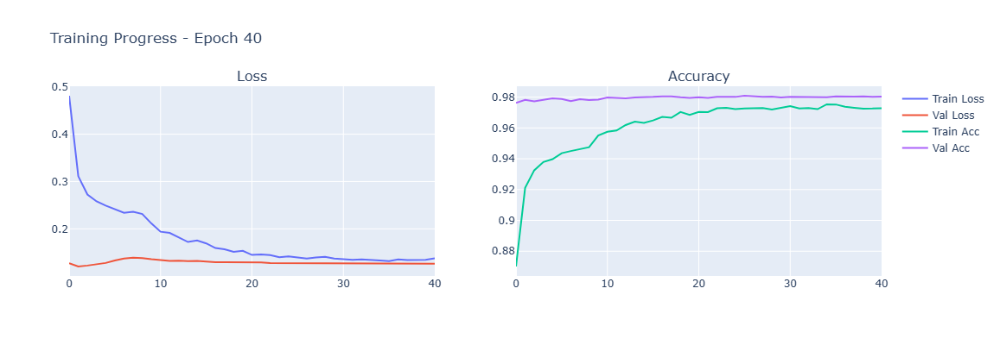

655/655 ━━━━━━━━━━━━━━━━━━━━ 26s 39ms/step - accuracy: 0.9728 - loss: 0.1375 - val_accuracy: 0.9803 - val_loss: 0.1261 - learning_rate: 2.4300e-06
Epoch 41: early stopping
Restoring model weights from the end of the best epoch: 26.


2025/10/26 20:50:28 WARNING mlflow.models.model: `artifact_path` is deprecated. Please use `name` instead.



📊 ОЦЕНКА ОБУЧЕННОЙ МОДЕЛИ...
164/164 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.9809 - loss: 0.1269
✅ Результаты обученной модели:
   - Validation Accuracy: 0.9809
   - Validation Loss: 0.1269
💾 Модель сохранена как 'best_optuna_model_animals10_0.9809.keras


'\nloaded_model.summary()\n\n# 5. После обучения запускаем TensorBoard\nprint("\n🎯 Для просмотра TensorBoard выполните:")\nprint("!tensorboard --logdir logs/fit") tensorboard --logdir=logs/animals10\nprint("И откройте http://localhost:6006/")\n'

In [16]:
# Обучаем финальную модель дольше
# Полный код для вашего случая
import datetime
import os
from tensorflow.keras.callbacks import TensorBoard

#import wandb
#from wandb.keras import WandbCallback
# Инициализация
#wandb.init(project="animals10-classification", config=config)

import mlflow
import mlflow.keras
mlflow.set_experiment("animals10_2")

# Использование
live_plot = LivePlotCallback()

import gc
#tf.keras.backend.clear_session()
#gc.collect()     # принудительно очищаем

best_model = tf.keras.models.load_model('model_optuna_best_params_animals10.keras')
best_model.summary()

# ОЦЕНКА НЕ ОБУЧЕННОЙ МОДЕЛИ
print(f"\n📊 ОЦЕНКА НЕ ОБУЧЕННОЙ  МОДЕЛИ...")
val_results = best_model.evaluate(validation_data, verbose=1)
val_loss, val_accuracy = val_results[0], val_results[1]
print(f"✅ Результаты обученной модели:")
print(f"   - Validation Accuracy: {val_accuracy:.4f}")
print(f"   - Validation Loss: {val_loss:.4f}")

# 1. Создаем папку для логов
log_dir = os.path.join("logs", "animals10", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
os.makedirs(log_dir, exist_ok=True)

# 2. Создаем callback
tensorboard_callback = TensorBoard(
    log_dir=log_dir,
    histogram_freq=1,
    write_graph=True,
    write_images=False,  # Можно отключить для экономии места
    update_freq='epoch',
    profile_batch=0
)

with mlflow.start_run():
    # Автоматическое логирование
    mlflow.keras.autolog()
    final_history = best_model.fit(
        train_data,
        epochs=70,
        validation_data=validation_data,
        class_weight=class_weights,  # ← вот это если надо функция баланса классов class_weights
        callbacks=[
            tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=15, restore_best_weights=True, verbose=1),
            tf.keras.callbacks.ModelCheckpoint(f'best_model-optuna_callback.keras', monitor='val_accuracy', save_best_only=True, verbose=1),
            tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', patience=7, factor=0.3, verbose=1),
            tensorboard_callback,
            live_plot,
            #wandb.keras.WandbCallback(monitor="val_accuracy", mode="max", save_model=True, log_weights=True, log_gradients=True)
        ],
        verbose=1
    )
    best_val_acc = max(final_history.history['val_accuracy'])
    mlflow.log_metric("best_val_accuracy", best_val_acc)
    


# ОЦЕНКА ОБУЧЕННОЙ МОДЕЛИ
print(f"\n📊 ОЦЕНКА ОБУЧЕННОЙ МОДЕЛИ...")
val_results = best_model.evaluate(validation_data, verbose=1)
val_loss, val_accuracy = val_results[0], val_results[1]
print(f"✅ Результаты обученной модели:")
print(f"   - Validation Accuracy: {val_accuracy:.4f}")
print(f"   - Validation Loss: {val_loss:.4f}")

# 8. СОХРАНЕНИЕ РЕЗУЛЬТАТОВ
# Сохраняем модель
best_model.save(f'best_optuna_model_animals10_{val_accuracy:.4f}.keras')
print(f"💾 Модель сохранена как 'best_optuna_model_animals10_{val_accuracy:.4f}.keras")

import gc
tf.keras.backend.clear_session()
gc.collect()     # принудительно очищаем

'''
loaded_model.summary()

# 5. После обучения запускаем TensorBoard
print("\n🎯 Для просмотра TensorBoard выполните:")
print("!tensorboard --logdir logs/fit") tensorboard --logdir=logs/animals10
print("И откройте http://localhost:6006/")
'''


In [ ]:
!tensorboard --logdir logs/fit

/home/oleg/miniconda3/envs/TF/lib/python3.10/site-packages/tensorboard/default.py:30: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources


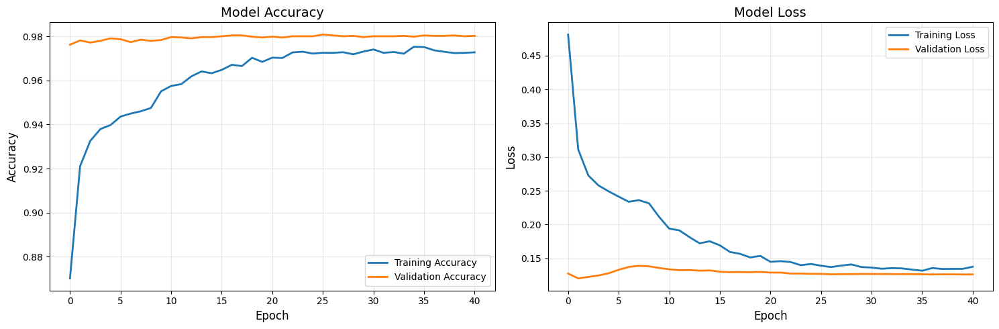

In [17]:
# Визуализация результатов

import matplotlib.pyplot as plt
import numpy as np

#history = final_history

def plot_training_history(history):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    
    # График точности
    ax1.plot(history.history['accuracy'], label='Training Accuracy', linewidth=2)
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy', linewidth=2)
    ax1.set_title('Model Accuracy', fontsize=14)
    ax1.set_xlabel('Epoch', fontsize=12)
    ax1.set_ylabel('Accuracy', fontsize=12)
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # График потерь
    ax2.plot(history.history['loss'], label='Training Loss', linewidth=2)
    ax2.plot(history.history['val_loss'], label='Validation Loss', linewidth=2)
    ax2.set_title('Model Loss', fontsize=14)
    ax2.set_xlabel('Epoch', fontsize=12)
    ax2.set_ylabel('Loss', fontsize=12)
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

# Построим графики
plot_training_history(final_history)


📊 ОЦЕНКА ЗАГРУЖЕННОЙ МОДЕЛИ...
164/164 ━━━━━━━━━━━━━━━━━━━━ 16s 43ms/step - accuracy: 0.9809 - loss: 0.1269
✅ Результаты обученной модели:
   - Validation Accuracy: 0.9809
   - Validation Loss: 0.1269
💾 Модель сохранена как 'trained_model_optuna_{val_accuracy:.4f}'


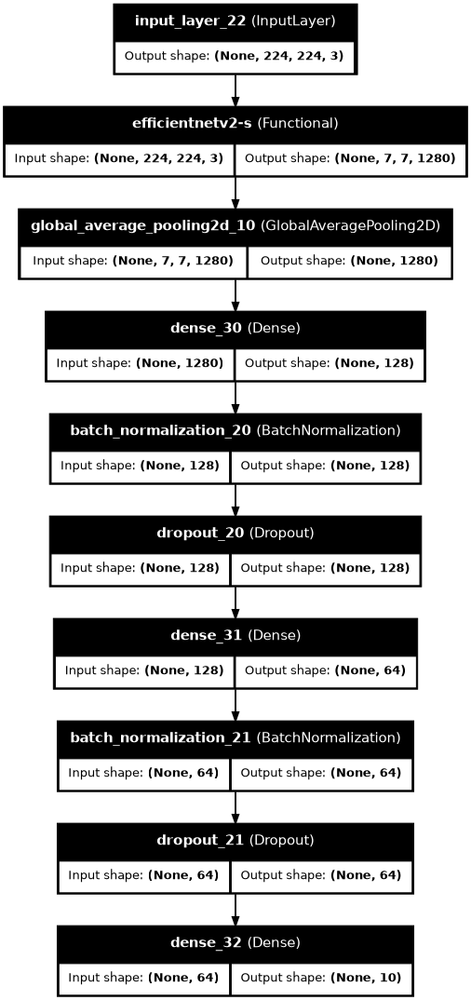

In [18]:
from tensorflow.keras.utils import plot_model
from PIL import Image

loaded_model = tf.keras.models.load_model('best_optuna_model_animals10_0.9809.keras')
#loaded_model.summary()


# ОЦЕНКА ЗАГРУЖЕННОЙ МОДЕЛИ
print(f"\n📊 ОЦЕНКА ЗАГРУЖЕННОЙ МОДЕЛИ...")
val_results = loaded_model.evaluate(validation_data, verbose=1)
val_loss, val_accuracy = val_results[0], val_results[1]
print(f"✅ Результаты обученной модели:")
print(f"   - Validation Accuracy: {val_accuracy:.4f}")
print(f"   - Validation Loss: {val_loss:.4f}")

# 8. СОХРАНЕНИЕ РЕЗУЛЬТАТОВ
# Сохраняем модель
loaded_model.save(f'trained_model_optuna_{val_accuracy:.4f}.keras')
print("💾 Модель сохранена как 'trained_model_optuna_{val_accuracy:.4f}'")

plot_model(loaded_model, to_file=f'trained_model_optuna_{val_accuracy:.4f}.png', show_shapes=True, show_layer_names=True, dpi=66)
#display(Image.open('model_temp.png'))
#plot_model(loaded_model, to_file=f'best_optuna_model_{val_accuracy:.4f}.png')


🚀 ЗАПУСК CONFUSION MATRIX АНАЛИЗА...
📊 ЗАПУСКАЕМ CONFUSION MATRIX АНАЛИЗ...
🔄 Получаем предсказания...
🔄 Собираем предсказания и метки...
📦 Обработано батчей: 10
📦 Обработано батчей: 20
📦 Обработано батчей: 30
📦 Обработано батчей: 40
📦 Обработано батчей: 50
📦 Обработано батчей: 60
📦 Обработано батчей: 70
📦 Обработано батчей: 80
📦 Обработано батчей: 90
📦 Обработано батчей: 100
📦 Обработано батчей: 110
📦 Обработано батчей: 120
📦 Обработано батчей: 130
📦 Обработано батчей: 140
📦 Обработано батчей: 150
📦 Обработано батчей: 160
✅ Собрано 5235 предсказаний
🔢 Уникальные истинные классы: [0 1 2 3 4 5 6 7 8 9]
🔢 Уникальные предсказанные классы: [0 1 2 3 4 5 6 7 8 9]
📋 Присутствующие классы: ['cane', 'cavallo', 'elefante', 'farfalla', 'gallina', 'gatto', 'mucca', 'pecora', 'ragno', 'scoiattolo']
📏 Confusion matrix shape: (10, 10)


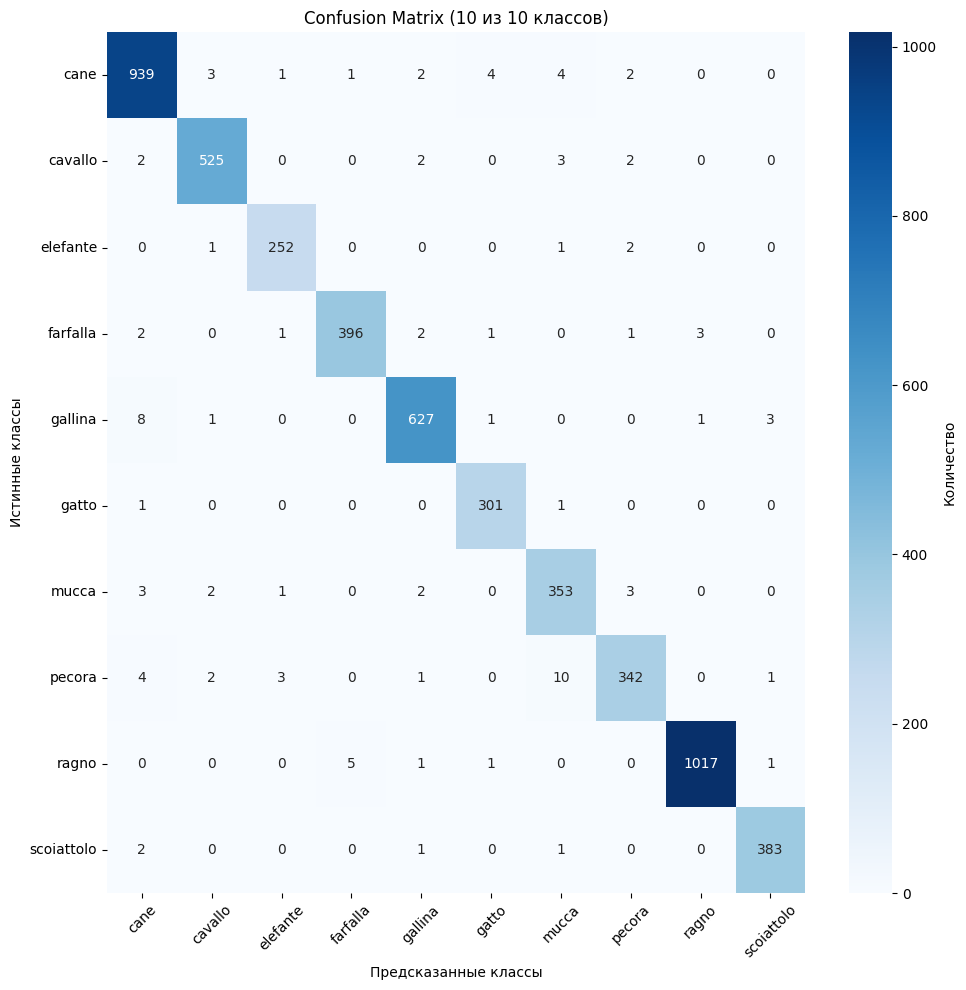


📈 ДЕТАЛЬНАЯ СТАТИСТИКА:
Всего примеров: 5235
Общая точность: 0.9809

🎯 ТОЧНОСТЬ ПО КЛАССАМ:
  cane: 0.9822 (939/956)
  cavallo: 0.9831 (525/534)
  elefante: 0.9844 (252/256)
  farfalla: 0.9754 (396/406)
  gallina: 0.9782 (627/641)
  gatto: 0.9934 (301/303)
  mucca: 0.9698 (353/364)
  pecora: 0.9421 (342/363)
  ragno: 0.9922 (1017/1025)
  scoiattolo: 0.9897 (383/387)

📊 CLASSIFICATION REPORT:
              precision    recall  f1-score   support

        cane     0.9771    0.9822    0.9797       956
     cavallo     0.9831    0.9831    0.9831       534
    elefante     0.9767    0.9844    0.9805       256
    farfalla     0.9851    0.9754    0.9802       406
     gallina     0.9828    0.9782    0.9805       641
       gatto     0.9773    0.9934    0.9853       303
       mucca     0.9464    0.9698    0.9579       364
      pecora     0.9716    0.9421    0.9566       363
       ragno     0.9961    0.9922    0.9941      1025
  scoiattolo     0.9871    0.9897    0.9884       387

    accu

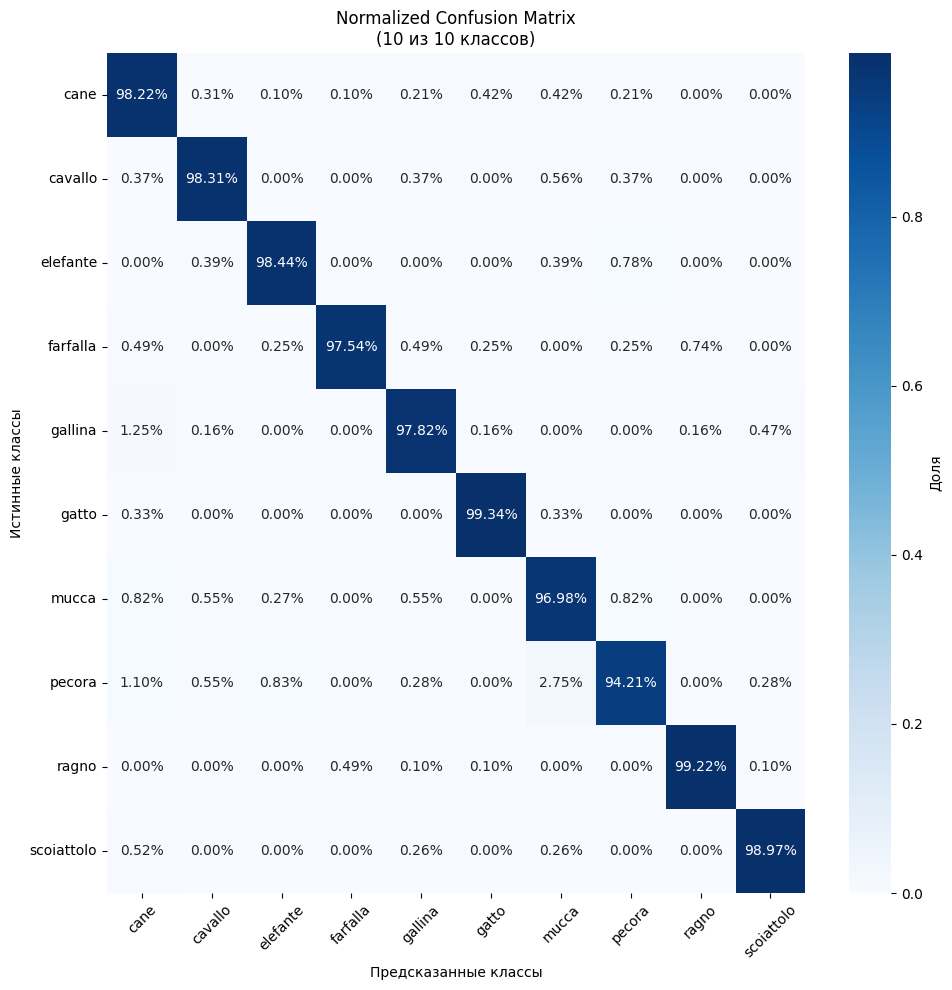

In [19]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
import tensorflow as tf

history = final_history

'''
Синие тона:
cmap='Blues' # твой текущий
cmap='viridis' 
cmap='coolwarm'
cmap='icefire'

Зеленые тона:
cmap='Greens'
cmap='viridis'
cmap='summer'

Красные/оранжевые:
cmap='Reds'
cmap='Oranges'
cmap='YlOrBr'  
cmap='hot'

Фиолетовые:
cmap='Purples'
cmap='magma'
cmap='plasma'
'''


def get_all_predictions_modern(model, dataset):
    """Получает все предсказания и метки из датасета"""
    print("🔄 Собираем предсказания и метки...")
    
    all_preds = []
    all_true_labels = []
    
    # Проходим по всем батчам датасета
    for batch_idx, (images, labels) in enumerate(dataset):
        # Получаем предсказания для текущего батча
        batch_preds = model.predict(images, verbose=0)
        all_preds.append(batch_preds)
        all_true_labels.append(labels.numpy())
        
        # Прогресс каждые 10 батчей
        if (batch_idx + 1) % 10 == 0:
            print(f"📦 Обработано батчей: {batch_idx + 1}")
    
    # Объединяем все батчи
    all_preds = np.concatenate(all_preds, axis=0)
    all_true_labels = np.concatenate(all_true_labels, axis=0)
    
    print(f"✅ Собрано {len(all_preds)} предсказаний")
    return all_preds, all_true_labels

def safe_confusion_matrix_analysis(model, dataset, class_names):
    """Безопасный анализ confusion matrix с автоматической обработкой отсутствующих классов"""
    print("📊 ЗАПУСКАЕМ CONFUSION MATRIX АНАЛИЗ...")
    
    # Получаем предсказания
    print("🔄 Получаем предсказания...")
    preds, true_labels = get_all_predictions_modern(model, dataset)
    
    # Для sparse categorical - метки уже целые числа, не нужно argmax
    if len(true_labels.shape) == 1:  # sparse labels [0, 1, 2, ...]
        true_classes = true_labels
    else:  # one-hot encoded labels
        true_classes = np.argmax(true_labels, axis=1)
    
    preds_classes = np.argmax(preds, axis=1)
    
    # Находим какие классы реально присутствуют в данных
    present_true_classes = np.unique(true_classes)
    present_pred_classes = np.unique(preds_classes)
    
    print(f"🔢 Уникальные истинные классы: {present_true_classes}")
    print(f"🔢 Уникальные предсказанные классы: {present_pred_classes}")
    
    # Определяем какие классы из class_names реально присутствуют
    present_class_indices = sorted(present_true_classes)
    present_class_names = [class_names[i] for i in present_class_indices]
    
    print(f"📋 Присутствующие классы: {present_class_names}")
    
    absent_classes = [class_names[i] for i in range(len(class_names)) if i not in present_true_classes]
    if absent_classes:
        print(f"❌ Отсутствующие классы: {absent_classes}")
    
    # Создаем confusion matrix только для присутствующих классов
    cm = confusion_matrix(true_classes, preds_classes, labels=present_class_indices)
    
    print(f"📏 Confusion matrix shape: {cm.shape}")
    
    # Визуализируем
    plt.figure(figsize=(max(8, len(present_class_names)), max(6, len(present_class_names))))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=present_class_names, 
                yticklabels=present_class_names,
                cbar_kws={'label': 'Количество'})
    plt.xlabel('Предсказанные классы')
    plt.ylabel('Истинные классы')
    plt.title(f'Confusion Matrix ({len(present_class_names)} из {len(class_names)} классов)')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()
    
    # Статистика
    total_samples = len(true_classes)
    accuracy = np.sum(preds_classes == true_classes) / total_samples
    
    print(f"\n📈 ДЕТАЛЬНАЯ СТАТИСТИКА:")
    print(f"Всего примеров: {total_samples}")
    print(f"Общая точность: {accuracy:.4f}")
    
    print(f"\n🎯 ТОЧНОСТЬ ПО КЛАССАМ:")
    for i, class_idx in enumerate(present_class_indices):
        class_name = class_names[class_idx]
        correct = cm[i, i]
        total = np.sum(cm[i, :])
        accuracy = correct / total if total > 0 else 0
        print(f"  {class_name}: {accuracy:.4f} ({correct}/{total})")
    
    # Для отсутствующих классов
    if absent_classes:
        print(f"\n❌ ОТСУТСТВУЮЩИЕ КЛАССЫ В ВАЛИДАЦИИ:")
        for class_name in absent_classes:
            print(f"  {class_name}: 0 примеров")
    
    # Classification report только для присутствующих классов
    print(f"\n📊 CLASSIFICATION REPORT:")
    print(classification_report(true_classes, preds_classes, 
                              labels=present_class_indices,
                              target_names=present_class_names, 
                              digits=4))
    
    # Нормализованная confusion matrix
    plt.figure(figsize=(max(8, len(present_class_names)), max(6, len(present_class_names))))
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    cm_normalized = np.nan_to_num(cm_normalized)  # Заменяем NaN на 0
    
    sns.heatmap(cm_normalized, annot=True, fmt='.2%', cmap='Blues',
                xticklabels=present_class_names, 
                yticklabels=present_class_names,
                cbar_kws={'label': 'Доля'})
    plt.xlabel('Предсказанные классы')
    plt.ylabel('Истинные классы')
    plt.title(f'Normalized Confusion Matrix\n({len(present_class_names)} из {len(class_names)} классов)')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()
    
    return cm, present_class_names

# 🎯 ЗАПУСКАЕМ АНАЛИЗ
print("🚀 ЗАПУСК CONFUSION MATRIX АНАЛИЗА...")
cm, present_classes = safe_confusion_matrix_analysis(best_model, validation_data, class_names)

In [ ]:
# рандом ВЕРСИЯ ДЛЯ SPARSE LABELS 

def test_random_predictions_modern(model, dataset, class_names, num_samples=12):
    """
    Тестирование случайных примеров из всего датасета
    ВЕРСИЯ ДЛЯ SPARSE LABELS (целочисленные метки)
    """
    # Собираем все изображения и метки
    all_images = []
    all_labels = []
    
    for images, labels in dataset:
        all_images.append(images.numpy())
        all_labels.append(labels.numpy())
    
    # Объединяем все батчи
    all_images = np.concatenate(all_images, axis=0)
    all_labels = np.concatenate(all_labels, axis=0)
    
    # Выбираем случайные индексы
    total_samples = len(all_images)
    indices = np.random.choice(total_samples, min(num_samples, total_samples), replace=False)
    
    selected_images = all_images[indices]
    selected_labels = all_labels[indices]
    
    # Предсказания
    predictions = model.predict(selected_images, verbose=0)
    predicted_classes = np.argmax(predictions, axis=1)
    
    # ДЛЯ SPARSE LABELS - просто используем как есть, без argmax!
    true_classes = selected_labels  # ← ИСПРАВЛЕНИЕ ЗДЕСЬ
    
    # Создаем сетку
    cols = 4
    rows = (num_samples + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
    
    if rows == 1:
        axes = axes.reshape(1, -1)
    elif rows > 1 and cols == 1:
        axes = axes.reshape(-1, 1)
    
    correct = 0
    for i, idx in enumerate(indices):
        if rows == 1:
            ax = axes[col] if cols > 1 else axes
        else:
            row_idx = i // cols
            col_idx = i % cols
            ax = axes[row_idx, col_idx]
        
        # Денормализация для ResNet50
        image = selected_images[i].copy()
        image[..., 0] += 103.939
        image[..., 1] += 116.779  
        image[..., 2] += 123.68
        image = np.clip(image, 0, 255).astype('uint8')
        image = image[..., ::-1]  # BGR to RGB
        
        ax.imshow(image)
        
        true_class = class_names[true_classes[i]]
        pred_class = class_names[predicted_classes[i]]
        confidence = np.max(predictions[i])
        
        color = 'green' if true_class == pred_class else 'red'
        if true_class == pred_class:
            correct += 1
            
        ax.set_title(f"True: {true_class}\nPred: {pred_class}\nConf: {confidence:.2f}", 
                    color=color, fontsize=10)
        ax.axis('off')
    
    # Скрываем пустые оси
    for i in range(len(indices), rows * cols):
        if rows == 1:
            if cols > 1:
                axes[i].axis('off')
        else:
            row_idx = i // cols
            col_idx = i % cols
            axes[row_idx, col_idx].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    accuracy = correct / len(indices) * 100
    print(f"📊 Точность на {len(indices)} случайных примерах: {correct}/{len(indices)} ({accuracy:.1f}%)")
    
    return correct, accuracy

# Использование случайных примеров:
print("🎲 Тестирование случайных примеров...")
correct, accuracy = test_random_predictions_modern(best_model, validation_data, class_names, num_samples=12)

🎲 Тестирование случайных примеров...


🎲 Тестирование случайных примеров (универсальная версия)...


2025-10-24 19:27:55.388711: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_2023', 16 bytes spill stores, 16 bytes spill loads

2025-10-24 19:27:55.598919: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_2023', 8 bytes spill stores, 8 bytes spill loads



🔍 Обнаружен формат меток: SPARSE


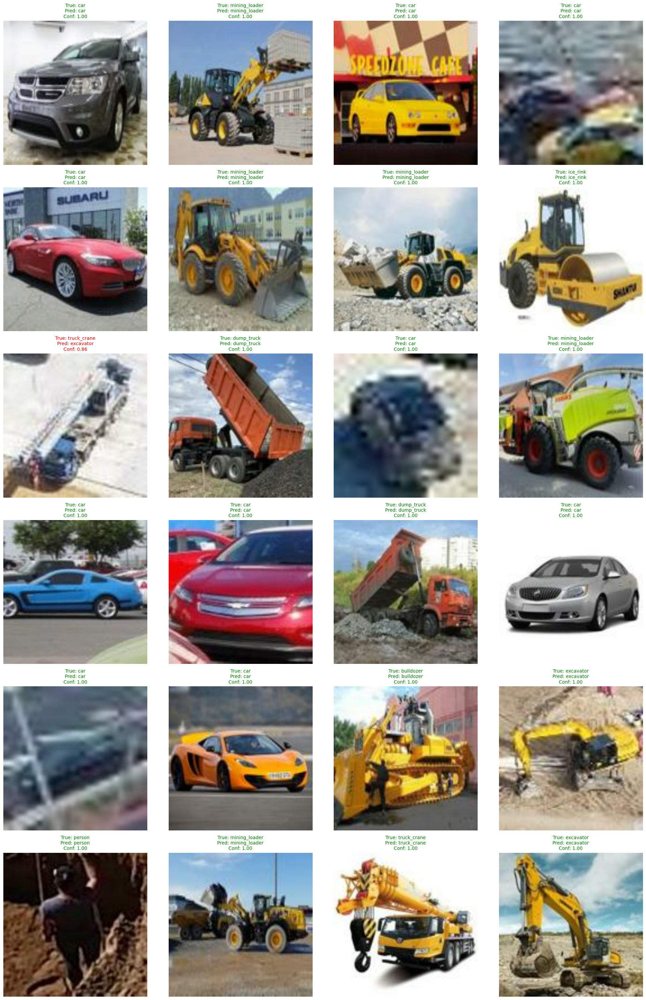

📊 Точность на 24 случайных примерах: 23/24 (95.8%)
🎯 Формат меток: SPARSE


In [14]:
# рандом УНИВЕРСАЛЬНАЯ ВЕРСИЯ (работает с любым форматом)

def test_random_predictions_universal(model, dataset, class_names, num_samples=12):
    """
    Универсальная версия для любого формата меток
    """
    # Собираем все изображения и метки
    all_images = []
    all_labels = []
    
    for images, labels in dataset:
        all_images.append(images.numpy())
        all_labels.append(labels.numpy())
    
    all_images = np.concatenate(all_images, axis=0)
    all_labels = np.concatenate(all_labels, axis=0)
    
    # Выбираем случайные индексы
    total_samples = len(all_images)
    indices = np.random.choice(total_samples, min(num_samples, total_samples), replace=False)
    
    selected_images = all_images[indices]
    selected_labels = all_labels[indices]
    
    # Предсказания
    predictions = model.predict(selected_images, verbose=0)
    predicted_classes = np.argmax(predictions, axis=1)
    
    # АВТОМАТИЧЕСКОЕ ОПРЕДЕЛЕНИЕ ФОРМАТА МЕТОК
    if len(selected_labels.shape) == 1:  # SPARSE labels
        true_classes = selected_labels
        label_format = "SPARSE"
    else:  # ONE-HOT labels
        true_classes = np.argmax(selected_labels, axis=1)
        label_format = "ONE-HOT"
    
    print(f"🔍 Обнаружен формат меток: {label_format}")
    
    # Создаем сетку
    cols = 4
    rows = (len(indices) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
    
    if rows == 1:
        axes = axes.reshape(1, -1)
    
    correct = 0
    for i, idx in enumerate(indices):
        row = i // cols
        col = i % cols
        ax = axes[row, col] if rows > 1 else axes[col]
        
        # Умная денормализация
        image = selected_images[i].copy()
        
        # Автоматическое определение диапазона
        if image.min() >= -1 and image.max() <= 1:
            image = (image + 1) * 127.5
        elif image.min() >= 0 and image.max() <= 1:
            image = image * 255
        else:
            # ImageNet нормализация
            image[..., 0] += 103.939
            image[..., 1] += 116.779  
            image[..., 2] += 123.68
        
        image = np.clip(image, 0, 255).astype('uint8')
        image = image[..., ::-1]  # BGR to RGB
        
        ax.imshow(image)
        
        true_class = class_names[true_classes[i]]
        pred_class = class_names[predicted_classes[i]]
        confidence = np.max(predictions[i])
        
        color = 'green' if true_class == pred_class else 'red'
        if true_class == pred_class:
            correct += 1
            
        ax.set_title(f"True: {true_class}\nPred: {pred_class}\nConf: {confidence:.2f}", 
                    color=color, fontsize=10)
        ax.axis('off')
    
    # Скрываем пустые оси
    for i in range(len(indices), rows * cols):
        row = i // cols
        col = i % cols
        if rows > 1:
            axes[row, col].axis('off')
        else:
            axes[col].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    accuracy = correct / len(indices) * 100
    print(f"📊 Точность на {len(indices)} случайных примерах: {correct}/{len(indices)} ({accuracy:.1f}%)")
    print(f"🎯 Формат меток: {label_format}")
    
    return correct, accuracy

# Тестируем универсальную версию
print("🎲 Тестирование случайных примеров (универсальная версия)...")
correct, accuracy = test_random_predictions_universal(best_model, validation_data, class_names, num_samples=24)

In [ ]:
# Сохраните модель

# Сохраняем обученную модель
model.save('cats_dogs_classifier.h5')
print("💾 Модель сохранена как 'cats_dogs_classifier.h5'")

# Или сохраняем только веса
model.save_weights('cats_dogs_weights.h5')
print("💾 Веса сохранены как 'cats_dogs_weights.h5'")

In [32]:
# Сохраняем в современном формате
model.save('best_model_scotp-2.keras')
print("💾 Модель сохранена как 'best_model_1.keras'")

💾 Модель сохранена как 'best_model_1.keras'
